# PINNS - SIR model

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from scipy.integrate import odeint
import torch.optim as optim
import time
from pinn_SIR import PINN

## Generate deterministic SIR data

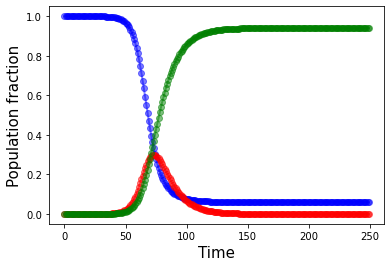

In [2]:
# Total population, N.
N = 1000000
# Initial number of infected and recovered individuals, I0 and R0.
I0, R0 = 1, 0
# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0 - R0
# Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
beta, gamma = 0.3, 1./10 
# A grid of time points (in days)
#t = np.linspace(0, 250, 250)
dt = 1
t = np.arange(0, 250, dt)
#print(t)

def model(y, t, N, beta, gamma):
    S, I, R = y
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return dSdt, dIdt, dRdt

# Initial conditions vector
y0 = S0, I0, R0

# Integrate the SIR equations over the time grid, t.
ret = odeint(model, y0, t, args=(N, beta, gamma))
S, I, R = ret.T

s = S / N
i = I / N
r = R / N

def delta(df):
    list_ = []
    list_.append(0)
    for j in range(len(df) - 1):
        list_.append(df[j+1] - df[j])
    return np.array(list_)  

ds = delta(s) 
di = delta(i)
dr = delta(r)


dS = delta(S) 
dI = delta(I)
dR = delta(R)


S_ = np.reshape(S, (S.shape[0], 1))
I_ = np.reshape(I, (I.shape[0], 1))
R_ = np.reshape(R, (R.shape[0], 1))
dS_ = np.reshape(dS, (dS.shape[0], 1))
dI_ = np.reshape(dI, (dI.shape[0], 1))
dR_ = np.reshape(dR, (dR.shape[0], 1))

X = np.hstack( (S_, I_, R_) )
dX = np.hstack( (dS_, dI_, dR_) )



s_ = np.reshape(s, (s.shape[0], 1))
i_ = np.reshape(i, (i.shape[0], 1))
r_ = np.reshape(r, (r.shape[0], 1))
t_ = np.reshape(t, (t.shape[0], 1))
ds_ = np.reshape(ds, (ds.shape[0], 1))
di_ = np.reshape(di, (di.shape[0], 1))
dr_ = np.reshape(dr, (dr.shape[0], 1))


x = np.hstack( (s_, i_, r_) )
dx = np.hstack( (ds_, di_, dr_) )

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(t, s, 'b', alpha=0.5, lw=2, label='Susceptible', marker= 'o')
ax.plot(t, i, 'r', alpha=0.5, lw=2, label='Infected', marker= 'o')
ax.plot(t, r, 'g', alpha=0.5, lw=2, label='Removed', marker= 'o')
ax.set_xlabel('Time', fontsize= 15)
ax.set_ylabel('Population fraction', fontsize= 15)
plt.show()

In [3]:
print('beta = ', beta)
print('gamma = ', gamma)
print('R0 = ', beta/gamma)
print('gamma x (1 - R0) = ', gamma*(1 - ( beta/gamma)))

beta =  0.3
gamma =  0.1
R0 =  2.9999999999999996
gamma x (1 - R0) =  -0.19999999999999996


## Function to generate data

In [27]:
def data_SIR(beta_in, gamma_in):

    # Total population, N.
    N = 1000000
    # Initial number of infected and recovered individuals, I0 and R0.
    I0, R0 = 1, 0
    # Everyone else, S0, is susceptible to infection initially.
    S0 = N - I0 - R0
    # Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
    beta, gamma = beta_in, gamma_in 
    # A grid of time points (in days)
    #t = np.linspace(0, 250, 250)
    dt = 1
    t = np.arange(0, 250, dt)
    #print(t)

    def model(y, t, N, beta, gamma):
        S, I, R = y
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        return dSdt, dIdt, dRdt

    # Initial conditions vector
    y0 = S0, I0, R0

    # Integrate the SIR equations over the time grid, t.
    ret = odeint(model, y0, t, args=(N, beta, gamma))
    S, I, R = ret.T

    s = torch.from_numpy(S / N).type(torch.float32)
    i = torch.from_numpy(I / N).type(torch.float32)
    r = torch.from_numpy(R / N).type(torch.float32)

    t = torch.from_numpy(t).type(torch.float32)

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.plot(t, s, 'b', alpha=0.5, lw=2, label='Susceptible', marker= 'o')
    ax.plot(t, i, 'r', alpha=0.5, lw=2, label='Infected', marker= 'o')
    ax.plot(t, r, 'g', alpha=0.5, lw=2, label='Removed', marker= 'o')
    ax.set_xlabel('Time', fontsize= 15)
    ax.set_ylabel('Population fraction', fontsize= 15)
    plt.legend()
    plt.show()

    return s, i, t

In [7]:
#layers = [3, 20, 20, 20, 20, 20, 20, 20, 20]
layers = [3, 20, 20]

s_tensor = torch.from_numpy(s).type(torch.float32)
i_tensor = torch.from_numpy(i).type(torch.float32)
t_tensor = torch.from_numpy(t).type(torch.float32)

model   = PINN(s_tensor, 
               i_tensor, 
               t_tensor, 
               layers_size= layers,    # indentify from where this 3 comes from  
               out_size = 2,     # psi and p
               params_list= None)


optimizer = optim.Adam(params= model.parameters(), 
                      lr= 0.001, 
                      weight_decay= 0.0)


epochs = 50000

for epoch in range(epochs):

    t0 = time.time()

    s_model, i_model, f_s, f_i = model.net(s_tensor, i_tensor, t_tensor)
    loss_ = model.loss(s_tensor, i_tensor, s_model, i_model, f_s, f_i)
    loss_print  = loss_

    optimizer.zero_grad()   # Clear gradients for the next mini-batches
    loss_.backward()         # Backpropagation, compute gradients
    optimizer.step()

    t1 = time.time()


    ### Training status
    print('Epoch %d, Loss= %.8f, beta= %.8f, gamma= %.8f Time= %.2f' % (epoch, 
                                                                                loss_print,
                                                                                list(model.parameters())[0].item(),
                                                                                list(model.parameters())[1].item(),
                                                                                t1-t0))

s= 0.1609488130, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 49723, Loss= 0.1609488279, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 49724, Loss= 0.1609486192, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 49725, Loss= 0.1609484404, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49726, Loss= 0.1609489769, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49727, Loss= 0.1609487832, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49728, Loss= 0.1609487385, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 49729, Loss= 0.1609483808, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49730, Loss= 0.1609486341, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49731, Loss= 0.1609483957, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49732, Loss= 0.1609484702, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49733, Loss= 0.1609486639, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49734, Loss= 0.1609485447, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 49735, Loss= 0.1609486789, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 49

In [44]:
def train(s_tensor, i_tensor, t_tensor):

    model   = PINN(s_tensor, 
                   i_tensor, 
                   t_tensor, 
                   layers_size= layers,    # indentify from where this 3 comes from  
                   out_size = 2,     # psi and p
                   params_list= None)


    optimizer = optim.Adam(params= model.parameters(), 
                        lr= 0.001, 
                        weight_decay= 0.0)


    epochs = 50000

    for epoch in range(epochs):

        t0 = time.time()

        s_model, i_model, f_s, f_i = model.net(s_tensor, i_tensor, t_tensor)
        loss_ = model.loss(s_tensor, i_tensor, s_model, i_model, f_s, f_i)
        loss_print  = loss_

        optimizer.zero_grad()   # Clear gradients for the next mini-batches
        loss_.backward()         # Backpropagation, compute gradients
        optimizer.step()

        t1 = time.time()


        ### Training status
        if epoch % 1000 == 0:
                
            print('Epoch %d, Loss= %.8f, beta= %.4f, gamma= %.4f Time= %.2f' % (epoch, 
                                                                                loss_print,
                                                                                list(model.parameters())[0].item(),
                                                                                list(model.parameters())[1].item(),
                                                                                t1-t0))

    return list(model.parameters())[0].item(), list(model.parameters())[1].item()

SIR parameters:
beta =  0.3
gamma =  0.1


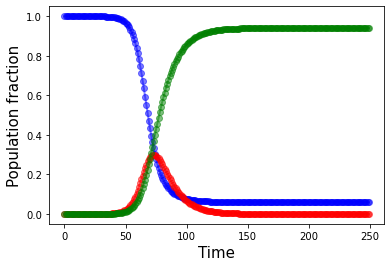

Training
Epoch 0, Loss= 1.36683166, beta= -0.0010, gamma= 0.0002 Time= 0.01
Epoch 1000, Loss= 0.16100447, beta= 0.2271, gamma= 0.0721 Time= 0.00
Epoch 2000, Loss= 0.16096362, beta= 0.3088, gamma= 0.0986 Time= 0.00
Epoch 3000, Loss= 0.16095820, beta= 0.3125, gamma= 0.0999 Time= 0.00
Epoch 4000, Loss= 0.16095370, beta= 0.3125, gamma= 0.0999 Time= 0.00
Epoch 5000, Loss= 0.16095094, beta= 0.3126, gamma= 0.0999 Time= 0.00
Epoch 6000, Loss= 0.16094990, beta= 0.3127, gamma= 0.1000 Time= 0.00
Epoch 7000, Loss= 0.16094939, beta= 0.3127, gamma= 0.1000 Time= 0.00
Epoch 8000, Loss= 0.16094904, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 9000, Loss= 0.16094907, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 10000, Loss= 0.16094881, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 11000, Loss= 0.16094892, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 12000, Loss= 0.16094859, beta= 0.3128, gamma= 0.1000 Time= 0.00
Epoch 13000, Loss= 0.16094868, beta= 0.3128, gamma= 0.1000 Time= 0.01
Epoch 14000, Loss= 0.16

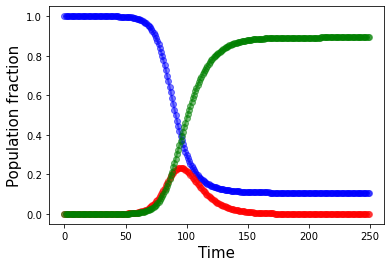

Training
Epoch 0, Loss= 2.46803403, beta= 0.0010, gamma= -0.0009 Time= 0.01
Epoch 1000, Loss= 0.16247906, beta= 0.1351, gamma= 0.0524 Time= 0.01
Epoch 2000, Loss= 0.16242407, beta= 0.2188, gamma= 0.0938 Time= 0.00
Epoch 3000, Loss= 0.16241427, beta= 0.2304, gamma= 0.0996 Time= 0.00
Epoch 4000, Loss= 0.16241083, beta= 0.2310, gamma= 0.0998 Time= 0.01
Epoch 5000, Loss= 0.16240847, beta= 0.2312, gamma= 0.0999 Time= 0.01
Epoch 6000, Loss= 0.16240685, beta= 0.2313, gamma= 0.0999 Time= 0.00
Epoch 7000, Loss= 0.16240597, beta= 0.2314, gamma= 0.1000 Time= 0.01
Epoch 8000, Loss= 0.16240570, beta= 0.2314, gamma= 0.1000 Time= 0.00
Epoch 9000, Loss= 0.16240551, beta= 0.2314, gamma= 0.1000 Time= 0.00
Epoch 10000, Loss= 0.16240774, beta= 0.2309, gamma= 0.0998 Time= 0.00
Epoch 11000, Loss= 0.16240542, beta= 0.2314, gamma= 0.1000 Time= 0.00
Epoch 12000, Loss= 0.16240594, beta= 0.2316, gamma= 0.1001 Time= 0.00
Epoch 13000, Loss= 0.16240589, beta= 0.2311, gamma= 0.0999 Time= 0.00
Epoch 14000, Loss= 0.16

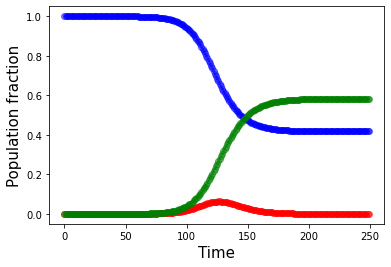

Training
Epoch 0, Loss= 13.40263557, beta= 0.0010, gamma= -0.0010 Time= 0.00
Epoch 1000, Loss= 0.07061244, beta= 0.0089, gamma= 0.0017 Time= 0.00
Epoch 2000, Loss= 0.06998152, beta= 0.0295, gamma= 0.0049 Time= 0.00
Epoch 3000, Loss= 0.06997407, beta= 0.0605, gamma= 0.0153 Time= 0.00
Epoch 4000, Loss= 0.06997015, beta= 0.1005, gamma= 0.0389 Time= 0.00
Epoch 5000, Loss= 0.06996712, beta= 0.1480, gamma= 0.0773 Time= 0.00
Epoch 6000, Loss= 0.06996468, beta= 0.1989, gamma= 0.1234 Time= 0.00
Epoch 7000, Loss= 0.06996278, beta= 0.2433, gamma= 0.1643 Time= 0.00
Epoch 8000, Loss= 0.06996147, beta= 0.2693, gamma= 0.1884 Time= 0.00
Epoch 9000, Loss= 0.06996176, beta= 0.2712, gamma= 0.1945 Time= 0.00
Epoch 10000, Loss= 0.06996047, beta= 0.2700, gamma= 0.1895 Time= 0.00
Epoch 11000, Loss= 0.06996027, beta= 0.2680, gamma= 0.1870 Time= 0.00
Epoch 12000, Loss= 0.06996011, beta= 0.2697, gamma= 0.1890 Time= 0.00
Epoch 13000, Loss= 0.06996008, beta= 0.2765, gamma= 0.1951 Time= 0.00
Epoch 14000, Loss= 0.0

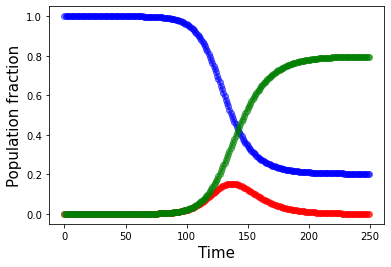

Training
Epoch 0, Loss= 2.99530816, beta= 0.0010, gamma= 0.0010 Time= 0.01
Epoch 1000, Loss= 0.12992981, beta= 0.1436, gamma= 0.0880 Time= 0.00
Epoch 2000, Loss= 0.12990695, beta= 0.1590, gamma= 0.0995 Time= 0.00
Epoch 3000, Loss= 0.12990546, beta= 0.1592, gamma= 0.0996 Time= 0.00
Epoch 4000, Loss= 0.12990452, beta= 0.1593, gamma= 0.0997 Time= 0.00
Epoch 5000, Loss= 0.12990376, beta= 0.1593, gamma= 0.0997 Time= 0.00
Epoch 6000, Loss= 0.12990315, beta= 0.1594, gamma= 0.0998 Time= 0.00
Epoch 7000, Loss= 0.12990271, beta= 0.1595, gamma= 0.0998 Time= 0.00
Epoch 8000, Loss= 0.12990230, beta= 0.1601, gamma= 0.1002 Time= 0.00
Epoch 9000, Loss= 0.12990198, beta= 0.1596, gamma= 0.0999 Time= 0.00
Epoch 10000, Loss= 0.12990214, beta= 0.1595, gamma= 0.0998 Time= 0.00
Epoch 11000, Loss= 0.12990166, beta= 0.1602, gamma= 0.1003 Time= 0.00
Epoch 12000, Loss= 0.12990274, beta= 0.1583, gamma= 0.0992 Time= 0.00
Epoch 13000, Loss= 0.12990120, beta= 0.1597, gamma= 0.1000 Time= 0.00
Epoch 14000, Loss= 0.129

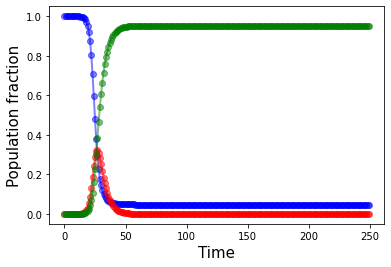

Training
Epoch 0, Loss= 22.53653908, beta= 0.0010, gamma= -0.0007 Time= 0.01
Epoch 1000, Loss= 0.07842154, beta= 0.0041, gamma= -0.0008 Time= 0.01
Epoch 2000, Loss= 0.07834380, beta= 0.0068, gamma= -0.0002 Time= 0.01
Epoch 3000, Loss= 0.07832746, beta= 0.0116, gamma= 0.0007 Time= 0.00
Epoch 4000, Loss= 0.07832296, beta= 0.0196, gamma= 0.0020 Time= 0.00
Epoch 5000, Loss= 0.07832190, beta= 0.0330, gamma= 0.0040 Time= 0.00
Epoch 6000, Loss= 0.07832050, beta= 0.0550, gamma= 0.0072 Time= 0.00
Epoch 7000, Loss= 0.07834649, beta= 0.0906, gamma= 0.0123 Time= 0.00
Epoch 8000, Loss= 0.07832412, beta= 0.1477, gamma= 0.0206 Time= 0.00
Epoch 9000, Loss= 0.07832033, beta= 0.2374, gamma= 0.0335 Time= 0.00
Epoch 10000, Loss= 0.07834067, beta= 0.3738, gamma= 0.0536 Time= 0.01
Epoch 11000, Loss= 0.07835649, beta= 0.5688, gamma= 0.0813 Time= 0.00
Epoch 12000, Loss= 0.07830874, beta= 0.8232, gamma= 0.1188 Time= 0.01
Epoch 13000, Loss= 0.07830671, beta= 1.1103, gamma= 0.1603 Time= 0.01
Epoch 14000, Loss= 0

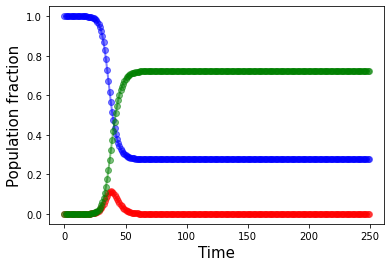

Training
Epoch 0, Loss= 5.70812225, beta= 0.0010, gamma= 0.0006 Time= 0.01
Epoch 1000, Loss= 0.06077195, beta= 0.0341, gamma= 0.0038 Time= 0.00
Epoch 2000, Loss= 0.06051281, beta= 0.1097, gamma= 0.0220 Time= 0.00
Epoch 3000, Loss= 0.06042659, beta= 0.2328, gamma= 0.0552 Time= 0.00
Epoch 4000, Loss= 0.06039925, beta= 0.4081, gamma= 0.1149 Time= 0.00
Epoch 5000, Loss= 0.06039133, beta= 0.6147, gamma= 0.2054 Time= 0.00
Epoch 6000, Loss= 0.06038897, beta= 0.8032, gamma= 0.2944 Time= 0.00
Epoch 7000, Loss= 0.06038802, beta= 0.9498, gamma= 0.3609 Time= 0.00
Epoch 8000, Loss= 0.06038742, beta= 1.0301, gamma= 0.4007 Time= 0.00
Epoch 9000, Loss= 0.06038709, beta= 1.0957, gamma= 0.4191 Time= 0.00
Epoch 10000, Loss= 0.06039134, beta= 1.0983, gamma= 0.4320 Time= 0.00
Epoch 11000, Loss= 0.06038718, beta= 1.0968, gamma= 0.4209 Time= 0.00
Epoch 12000, Loss= 0.06038923, beta= 1.1063, gamma= 0.4272 Time= 0.01
Epoch 13000, Loss= 0.06038704, beta= 1.1045, gamma= 0.4244 Time= 0.00
Epoch 14000, Loss= 0.060

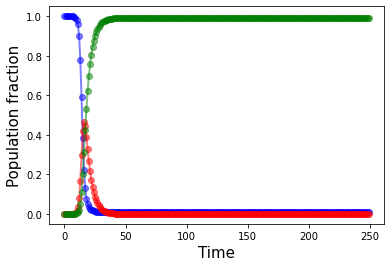

Training
Epoch 0, Loss= 0.12491154, beta= -0.0010, gamma= 0.0001 Time= 0.00
Epoch 1000, Loss= 0.05603720, beta= 0.5826, gamma= 0.0400 Time= 0.00
Epoch 2000, Loss= 0.05603989, beta= 1.3411, gamma= 0.0923 Time= 0.00
Epoch 3000, Loss= 0.05602482, beta= 2.0392, gamma= 0.1398 Time= 0.00
Epoch 4000, Loss= 0.05614888, beta= 2.6337, gamma= 0.1825 Time= 0.00
Epoch 5000, Loss= 0.05602620, beta= 3.0536, gamma= 0.2065 Time= 0.00
Epoch 6000, Loss= 0.05602168, beta= 3.3285, gamma= 0.2280 Time= 0.00
Epoch 7000, Loss= 0.05602143, beta= 3.4523, gamma= 0.2365 Time= 0.00
Epoch 8000, Loss= 0.05608155, beta= 3.4898, gamma= 0.2536 Time= 0.00
Epoch 9000, Loss= 0.05602114, beta= 3.5108, gamma= 0.2405 Time= 0.00
Epoch 10000, Loss= 0.05602438, beta= 3.4860, gamma= 0.2383 Time= 0.00
Epoch 11000, Loss= 0.05603867, beta= 3.5324, gamma= 0.2422 Time= 0.00
Epoch 12000, Loss= 0.05602095, beta= 3.5316, gamma= 0.2420 Time= 0.00
Epoch 13000, Loss= 0.05602258, beta= 3.5189, gamma= 0.2395 Time= 0.00
Epoch 14000, Loss= 0.05

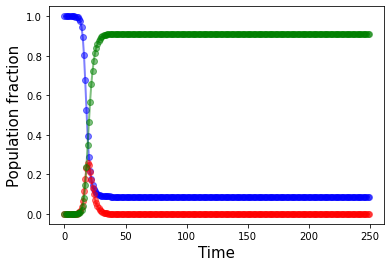

Training
Epoch 0, Loss= 8.03225231, beta= -0.0010, gamma= 0.0007 Time= 0.01
Epoch 1000, Loss= 0.05389287, beta= 0.0079, gamma= 0.0000 Time= 0.00
Epoch 2000, Loss= 0.05376588, beta= 0.0343, gamma= 0.0013 Time= 0.01
Epoch 3000, Loss= 0.05374624, beta= 0.0812, gamma= 0.0051 Time= 0.00
Epoch 4000, Loss= 0.05373883, beta= 0.1586, gamma= 0.0144 Time= 0.01
Epoch 5000, Loss= 0.05373522, beta= 0.2823, gamma= 0.0325 Time= 0.00
Epoch 6000, Loss= 0.05373207, beta= 0.4732, gamma= 0.0629 Time= 0.00
Epoch 7000, Loss= 0.05372966, beta= 0.7521, gamma= 0.1081 Time= 0.00
Epoch 8000, Loss= 0.05372635, beta= 1.1232, gamma= 0.1687 Time= 0.01
Epoch 9000, Loss= 0.05372360, beta= 1.5481, gamma= 0.2396 Time= 0.00
Epoch 10000, Loss= 0.05372206, beta= 1.9568, gamma= 0.3024 Time= 0.00
Epoch 11000, Loss= 0.05372138, beta= 2.2535, gamma= 0.3577 Time= 0.00
Epoch 12000, Loss= 0.05372110, beta= 2.4409, gamma= 0.3797 Time= 0.00
Epoch 13000, Loss= 0.05372140, beta= 2.5435, gamma= 0.3962 Time= 0.00
Epoch 14000, Loss= 0.05

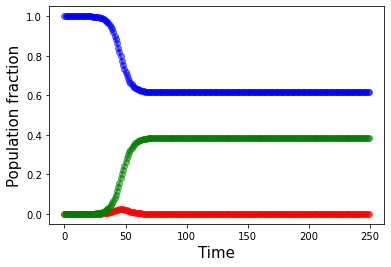

Training
Epoch 0, Loss= 18.42212105, beta= 0.0010, gamma= -0.0004 Time= 0.00
Epoch 1000, Loss= 0.02009510, beta= 0.0028, gamma= 0.0011 Time= 0.00
Epoch 2000, Loss= 0.01994727, beta= 0.0066, gamma= 0.0021 Time= 0.00
Epoch 3000, Loss= 0.01991238, beta= 0.0133, gamma= 0.0040 Time= 0.00
Epoch 4000, Loss= 0.01989848, beta= 0.0249, gamma= 0.0066 Time= 0.01
Epoch 5000, Loss= 0.01989795, beta= 0.0446, gamma= 0.0110 Time= 0.00
Epoch 6000, Loss= 0.01989466, beta= 0.0765, gamma= 0.0210 Time= 0.00
Epoch 7000, Loss= 0.01989390, beta= 0.1273, gamma= 0.0437 Time= 0.00
Epoch 8000, Loss= 0.01989321, beta= 0.2060, gamma= 0.0906 Time= 0.01
Epoch 9000, Loss= 0.01989312, beta= 0.3204, gamma= 0.1756 Time= 0.01
Epoch 10000, Loss= 0.01989198, beta= 0.4684, gamma= 0.2929 Time= 0.00
Epoch 11000, Loss= 0.01989152, beta= 0.6132, gamma= 0.4073 Time= 0.00
Epoch 12000, Loss= 0.01989129, beta= 0.7183, gamma= 0.4851 Time= 0.00
Epoch 13000, Loss= 0.01989122, beta= 0.7720, gamma= 0.5243 Time= 0.01
Epoch 14000, Loss= 0.0

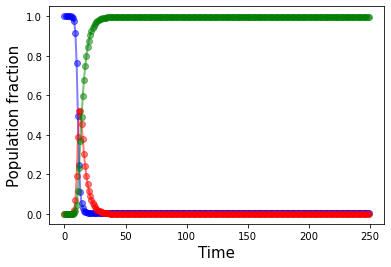

Training
Epoch 0, Loss= 16.17832756, beta= 0.0010, gamma= -0.0007 Time= 0.01
Epoch 1000, Loss= 0.04667136, beta= 0.0042, gamma= -0.0001 Time= 0.00
Epoch 2000, Loss= 0.04654312, beta= 0.0068, gamma= 0.0001 Time= 0.00
Epoch 3000, Loss= 0.04653161, beta= 0.0113, gamma= 0.0004 Time= 0.00
Epoch 4000, Loss= 0.04652585, beta= 0.0191, gamma= 0.0007 Time= 0.00
Epoch 5000, Loss= 0.04652289, beta= 0.0319, gamma= 0.0014 Time= 0.00
Epoch 6000, Loss= 0.04652109, beta= 0.0531, gamma= 0.0024 Time= 0.00
Epoch 7000, Loss= 0.04652018, beta= 0.0878, gamma= 0.0041 Time= 0.00
Epoch 8000, Loss= 0.04651908, beta= 0.1445, gamma= 0.0069 Time= 0.01
Epoch 9000, Loss= 0.04651819, beta= 0.2365, gamma= 0.0114 Time= 0.00
Epoch 10000, Loss= 0.04651703, beta= 0.3837, gamma= 0.0186 Time= 0.00
Epoch 11000, Loss= 0.04651630, beta= 0.6130, gamma= 0.0298 Time= 0.00
Epoch 12000, Loss= 0.04651362, beta= 0.9531, gamma= 0.0464 Time= 0.00
Epoch 13000, Loss= 0.04651114, beta= 1.4194, gamma= 0.0693 Time= 0.00
Epoch 14000, Loss= 0.

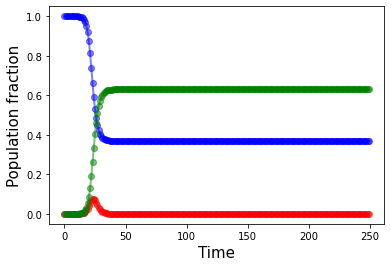

Training
Epoch 0, Loss= 0.87363005, beta= 0.0010, gamma= -0.0003 Time= 0.00
Epoch 1000, Loss= 0.03084344, beta= 0.0153, gamma= 0.0043 Time= 0.00
Epoch 2000, Loss= 0.03072452, beta= 0.0534, gamma= 0.0137 Time= 0.00
Epoch 3000, Loss= 0.03070599, beta= 0.1243, gamma= 0.0325 Time= 0.00
Epoch 4000, Loss= 0.03070165, beta= 0.2376, gamma= 0.0760 Time= 0.00
Epoch 5000, Loss= 0.03069914, beta= 0.4064, gamma= 0.1515 Time= 0.01
Epoch 6000, Loss= 0.03069713, beta= 0.6309, gamma= 0.2527 Time= 0.00
Epoch 7000, Loss= 0.03069579, beta= 0.8740, gamma= 0.3601 Time= 0.00
Epoch 8000, Loss= 0.03069473, beta= 1.0356, gamma= 0.4455 Time= 0.01
Epoch 9000, Loss= 0.03069437, beta= 1.1280, gamma= 0.4813 Time= 0.00
Epoch 10000, Loss= 0.03069383, beta= 1.2061, gamma= 0.5126 Time= 0.00
Epoch 11000, Loss= 0.03069387, beta= 1.2419, gamma= 0.5294 Time= 0.00
Epoch 12000, Loss= 0.03069414, beta= 1.2403, gamma= 0.5387 Time= 0.00
Epoch 13000, Loss= 0.03069349, beta= 1.2875, gamma= 0.5484 Time= 0.00
Epoch 14000, Loss= 0.03

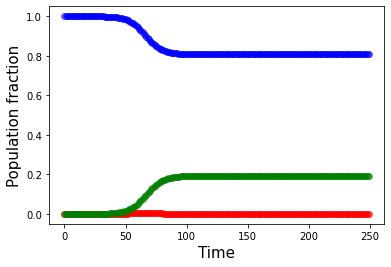

Training
Epoch 0, Loss= 11.04785633, beta= 0.0010, gamma= -0.0007 Time= 0.01
Epoch 1000, Loss= 0.00642261, beta= 0.0012, gamma= 0.0005 Time= 0.00
Epoch 2000, Loss= 0.00630117, beta= 0.0043, gamma= 0.0012 Time= 0.01
Epoch 3000, Loss= 0.00628252, beta= 0.0101, gamma= 0.0022 Time= 0.00
Epoch 4000, Loss= 0.00627766, beta= 0.0204, gamma= 0.0037 Time= 0.01
Epoch 5000, Loss= 0.00627590, beta= 0.0380, gamma= 0.0062 Time= 0.00
Epoch 6000, Loss= 0.00627522, beta= 0.0671, gamma= 0.0108 Time= 0.00
Epoch 7000, Loss= 0.00627491, beta= 0.1114, gamma= 0.0212 Time= 0.00
Epoch 8000, Loss= 0.00627466, beta= 0.1710, gamma= 0.0461 Time= 0.00
Epoch 9000, Loss= 0.00628287, beta= 0.1277, gamma= 0.1108 Time= 0.00
Epoch 10000, Loss= 0.00627441, beta= 0.1050, gamma= 0.0992 Time= 0.00
Epoch 11000, Loss= 0.00627432, beta= 0.1027, gamma= 0.0855 Time= 0.00
Epoch 12000, Loss= 0.00627431, beta= 0.0806, gamma= 0.0779 Time= 0.00
Epoch 13000, Loss= 0.00628330, beta= 0.0718, gamma= 0.0803 Time= 0.00
Epoch 14000, Loss= 0.0

In [45]:
param_list = [[0.3, 0.1], [0.25, 0.1], [0.3, 0.2] ,  [0.2, 0.1], [0.8, 0.25], [0.8, 0.45], [1.2, 0.25], [1.2, 0.45], [1.2, 0.95], [1.5, 0.25], [1.5, 0.95], [1.5, 1.35]]

beta_model_ = []
gamma_model_ = []
beta_data_ = []
gamma_data_ = []

for j in range(len(param_list)):

    beta = param_list[j][0]
    gamma = param_list[j][1]

    beta_data_.append(beta)
    gamma_data_.append(gamma)

    print('SIR parameters:')
    print('beta = ', beta)
    print('gamma = ', gamma)

    s, i, t = data_SIR(beta, gamma)

    print('Training')
    beta_model, gamma_model = train(s, i, t)

    beta_model_.append(beta_model)
    gamma_model_.append(gamma_model)

    print('beta = ', beta)
    print('gamma = ', gamma)
    print('beta_pred = ', beta_model)
    print('gmma_pred = ', gamma_model)

## Generate SEI(HC)R model

Based on [COVID-19-Scenarios](https://neherlab.org/covid19/about)

In [125]:
def beta_(t):
    x = 2.7
    return x


def SEIRHCR_model(y, t, N, params):
    
    S, E, I, H, C, R, D = y

    gamma_L, gamma_IR, gamma_IH, f_IR, gamma_C, gamma_H, f_HC, f_CD = params
    beta = beta_(t)
       
    dSdt = - beta*S* I /N
    
    dEdt = beta*S* I /N - gamma_L* E
    
    dIdt = gamma_L* E - gamma_IR*f_IR* I - gamma_IH*(1. - f_IR)* I
    
    dHdt = gamma_IH*(1. - f_IR)* I + gamma_C*(1. - f_CD)* C - gamma_H* H
    
    dCdt = gamma_H*f_HC* H - gamma_C* C
    
    dRdt = gamma_IR*f_IR* I + gamma_H*(1. - f_HC) *H
    
    dDdt = f_CD*gamma_C* C
    
    return dSdt, dEdt, dIdt, dHdt, dCdt, dRdt, dDdt

Arbitrary parameters

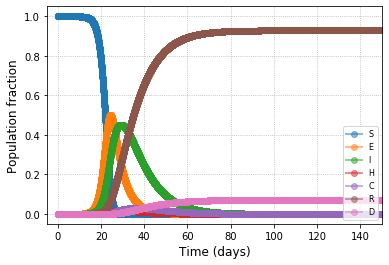

In [126]:
# Total population
N = 1000000

# Average incubation time scale 
gamma_L = 1./5
# average time an infected individual recovers without hospitalization
gamma_IR = 1./14
# average time an infected individual with mild symptoms goes to a critical condition (needs hospitalization)
gamma_IH = 1./5
# fraction of infectious that are asymptomatic or mild (no hospitalization).
f_IR = 0.7
# average time an infected individual in critical case (ICU) dies or gets better to leave the ICU$.
gamma_C = 1./7
# average time a hospitalized person recovers or deteriorates to a critical state.
gamma_H = 1.7
# fraction of hospitalized cases that turn to critical
f_HC = 0.2
# fraction of critial cases that are fatal
f_CD = 0.6

E0, I0, H0, C0, R0, D0 = 0, 1, 0, 0, 0, 0

# Everyone else, S0, is susceptible to infection initially.
S0 = N - E0 - I0 - H0 - C0 - R0 - D0

# Grid of time poins, in days
dt = 0.01
t = np.arange(0, 250, dt)

# Initial conditions vector
y0 = S0, E0, I0, H0, C0, R0, D0

# Parameters
params = gamma_L, gamma_IR, gamma_IH, f_IR, gamma_C, gamma_H, f_HC, f_CD

# Integrate the SIR equations over the time grid, t.
ret = odeint(SEIRHCR_model, y0, t, args=(N, params))
S, E, I, H, C, R, D = ret.T

s = S/N
e = E/N
i = I/N
h = H/N
c = C/N
r = R/N
d = D/N

plt.plot(t, s, color= 'C0', label='S', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, e, color= 'C1', label='E', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, i, color= 'C2', label='I', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, h, color= 'C3', label='H', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, c, color= 'C4', label='C', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, r, color= 'C5', label='R', marker= 'o', alpha=0.5, lw=2)
plt.plot(t, d, color= 'C6', label='D', marker= 'o', alpha=0.5, lw=2)
plt.xlabel('Time (days)', fontsize= 12)
plt.ylabel('Population fraction', fontsize= 12)
plt.xlim([-5, 150])
plt.grid(linestyle=':')
plt.legend(loc= 'lower right', fontsize= 8)
plt.show()

In [127]:
s_ = np.reshape(s, (s.shape[0], 1))
e_ = np.reshape(e, (e.shape[0], 1))
i_ = np.reshape(i, (i.shape[0], 1))
h_ = np.reshape(h, (h.shape[0], 1))
c_ = np.reshape(c, (c.shape[0], 1))
r_ = np.reshape(r, (r.shape[0], 1))
d_ = np.reshape(d, (d.shape[0], 1))

x = np.hstack( (e_, i_, h_, c_, r_, d_) )
#x = np.hstack( (s_, e_, i_, h_, c_, r_, d_) )

In [129]:
poly_order = 2
threshold = 0.01
seed = 12
np.random.seed(seed)  # Seed for reproducibility

model = ps.SINDy(optimizer= ps.STLSQ(threshold=threshold))
model.fit(x,  t= dt)
model.print()

x0' = -0.201 x0 + 2.700 x1 + 0.014 x4 + -2.695 x0 x1 + -0.175 x0 x2 + -0.012 x0 x4 + -2.685 x1^2 + 27.705 x1 x3 + -6.436 x1 x4 + 45.885 x1 x5 + -0.006 x3 x4 + -0.015 x4^2
x1' = 0.200 x0 + -0.110 x1
x2' = 0.000
x3' = -0.059 x3 + 0.021 x1^2 + -0.020 x3 x4
x4' = 0.068 x1 + 0.134 x4 + 0.007 x1^2 + -0.107 x1 x4 + -0.145 x4^2
x5' = 0.086 x3
/home/rodrigo/anaconda3/lib/python3.7/site-packages/pysindy/optimizers/stlsq.py:156: UserWarning: Sparsity parameter is too big (0.01) and eliminated all coefficients
  "coefficients".format(self.threshold)
/home/rodrigo/anaconda3/lib/python3.7/site-packages/pysindy/optimizers/stlsq.py:156: UserWarning: Sparsity parameter is too big (0.01) and eliminated all coefficients
  "coefficients".format(self.threshold)


In [144]:
from sklearn.linear_model import Lasso

model = ps.SINDy(
    optimizer= Lasso(alpha= 0.001))
model.fit(x)
model.print()

x0' = 0.000
x1' = -0.000
x2' = 0.000
x3' = 0.000
x4' = 0.000
x5' = 0.000


In [120]:
print('gamma_L = ', gamma_L)
print('gamma_IR = ', gamma_IR)
print('gamma_IR x f_IR = ', gamma_IR*f_IR)
print('gamma_IH = ', gamma_IH)
print('gamma_IH x (1 - f_IR) = ', gamma_IH*(1-f_IR))
print('f_IR = ', f_IR)
print('gamma_C = ', gamma_C)
print('gamma_C x (1 - f_CD) = ', gamma_C*(1-f_CD))
print('gamma_H = ', gamma_H)
print('gamma_H x f_HC = ', gamma_H*f_HC)
print('gamma_H x (1- f_HC) = ', gamma_H*(1-f_HC))
print('f_HC = ', f_HC)
print('f_CD = ', f_CD)
print('gamma_C x f_CD = ', gamma_C*f_CD)

gamma_L =  0.2
gamma_IR =  0.07142857142857142
gamma_IR x f_IR =  0.049999999999999996
gamma_IH =  0.2
gamma_IH x (1 - f_IR) =  0.06000000000000001
f_IR =  0.7
gamma_C =  0.14285714285714285
gamma_C x (1 - f_CD) =  0.05714285714285714
gamma_H =  1.7
gamma_H x f_HC =  0.34
gamma_H x (1- f_HC) =  1.36
f_HC =  0.2
f_CD =  0.6
gamma_C x f_CD =  0.0857142857142857


In [8]:
x = np.linspace(0, 20, 2000)

In [ ]:
# Average incubation time scale 
gamma_L = 1./5
# average time an infected individual recovers without hospitalization
gamma_IR = 1./14
# average time an infected individual with mild symptoms goes to a critical condition (needs hospitalization)
gamma_IH = 1./5
# fraction of infectious that are asymptomatic or mild (no hospitalization).
f_IR = 0.7
# average time an infected individual in critical case (ICU) dies or gets better to leave the ICU$.
gamma_C = 1./7
# average time a hospitalized person recovers or deteriorates to a critical state.
gamma_H = 1.7
# fraction of hospitalized cases that turn to critical
f_HC = 0.2
# fraction of critial cases that are fatal
f_CD = 0.6